In [13]:
import pandas as pd
import seaborn as sns
import numpy as np
import math
import datetime
import re

import lightgbm as lgb
import xgboost as xgb
sns.set()

In [2]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [110]:
data = pd.read_csv('train.csv')

D:\Blazej\Programs\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [112]:
data['Position'].unique()

array(['SS', 'DE', 'ILB', 'FS', 'CB', 'DT', 'WR', 'TE', 'T', 'QB', 'RB',
       'G', 'C', 'OLB', 'NT', 'FB', 'MLB', 'LB', 'OT', 'OG', 'HB', 'DB',
       'S', 'DL', 'SAF'], dtype=object)

In [4]:
data.shape

(509762, 49)

## Columns

Each row in the file corresponds to a single player's involvement in a single play. The dataset was intentionally joined (i.e. denormalized) to make the API simple. All the columns are contained in one large dataframe which is grouped and provided by PlayId. **This dataset only contains passing plays** (https://www.kaggle.com/c/nfl-big-data-bowl-2020/discussion/111935#latest-645825)

* GameId - a unique game identifier
* PlayId - a unique play identifier
* Team - home or away
* X - player position along the long axis of the field. See figure below.
* Y - player position along the short axis of the field. See figure below.
* S - speed in yards/second
* A - acceleration in yards/second^2
* Dis - distance traveled from prior time point, in yards (by that player?)
* Orientation - orientation of player (deg)
* Dir - angle of player motion (deg)
* NflId - a unique identifier of the player
* DisplayName - player's name
* JerseyNumber - jersey number
* Season - year of the season<br>
The data is gathere from two seasons: 2017/2018 for which the value is 2017 and 2018/19 for which the value is 2018
* YardLine - the yard line of the line of scrimmage
* Quarter - game quarter (1-5, 5 == overtime)
* GameClock - time on the game clock<br>
The game clock starts at 15:00:00 at the beginning of every quarter and then goes until 00:00:00 when the quarter ends. Then the clock is reset to 15 mins when the new quarter starts.
* PossessionTeam - team with possession
* Down - the down (1-4)
* Distance - yards needed for a first down
* FieldPosition - which side of the field the play is happening on
* HomeScoreBeforePlay - home team score before play started
* VisitorScoreBeforePlay - visitor team score before play started
* NflIdRusher - the NflId of the rushing player<br>
Rushing, on offense, is running with the ball when starting from behind the line of scrimmage with an intent of gaining yardage. While this usually means a running play, any offensive play that does not involve a forward pass is a rush - also called a run. It is usually done by the running back after a handoff from the quarterback, although quarterbacks and wide receivers can also rush. The quarterback will usually run when a passing play has broken down – such as when there is no receiver open to catch the ball – and there is room to run down the field.
* OffenseFormation - offense formation
* OffensePersonnel - offensive team positional grouping
* DefendersInTheBox - number of defenders lined up near the line of scrimmage, spanning the width of the offensive line
* DefensePersonnel - defensive team positional grouping
* PlayDirection - direction the play is headed
* TimeHandoff - UTC time of the handoff<br>
In American football, a hand-off is the act of handing the ball directly from one player to another, i. e. without it leaving the first player's hands.Most rushing plays on offense begin with a handoff from the quarterback to another running back.
* TimeSnap - UTC time of the snap <br>
A snap (colloquially called a "hike", "snapback", or "pass from center") is the backwards passing of the ballat the start of play from scrimmage.
* Yards - the yardage gained on the play (you are predicting this)
* PlayerHeight - player height (ft-in)
* PlayerWeight - player weight (lbs)
* PlayerBirthDate - birth date (mm/dd/yyyy)
* PlayerCollegeName - where the player attended college
* Position - the player's position (the specific role on the field that they typically play)
* HomeTeamAbbr - home team abbreviation
* VisitorTeamAbbr - visitor team abbreviation
* Week - week into the season
* Stadium - stadium where the game is being played
* Location - city where the game is being player
* StadiumType - description of the stadium environment
* Turf - description of the field surface
* GameWeather - description of the game weather
* Temperature - temperature (deg F)
* Humidity - humidity
* WindSpeed - wind speed in miles/hour
* WindDirection - wind direction
<img src="columns_visualization.png">
<img src="down_and_distance.png">

## Rules
* The offence is given 4 chances (or 4 downs) to make at least 10 yards. If they do so, they retain the possesion and have another 4 chances to move 10 yards. Otherwise, the defending team gets the ball at that point

Each team usually consists of 3 units

* Offensive unit<br>
<img src="offensive_unit.png" width="400" align="left">

* Defensive unit<br>
<img src="defensive_unit.png" width="400" align="left">

* Special teams

There are 4 different ways of scoring:
1. Touchdown - 6 points - the ball is carried into the endzone or thrown into the endzone and caught
2. Extra points - after a touchdown is scored: kick through the uprights (1 point) or try to get the ball to the endzone again for 2 points (most team go for the kick)
3. Field goal - a ball must be passed to a player who will hold the ball at the ground ready for the kicker to make a kick, a successful kick scores 3 points
4. Safety - if the defense tackles the defensive player behind his own goal line, the defensive team gets 2 points

* Fumble - when the ball carrier drops the ball on the ground, the team that recovers it gets the posession.
* Interception - intercepting passes
* Sack - defense tackles the quarterback while he has the ball (down is wasted)
* Incomplete pass - when a pass touches the ground before reaching the receiver or goes out (down is wasted)
* Penalty - after a player makes a foul his team is penalized some yards
* Challenge - same as in tennis
* Timeout - each team has 3 timeouts per half, each timeout lasts 60 seconds
* Line of scrimmage - an imaginary transverse line (across the width of the football field) beyond which a team cannot cross until the next play has begun. Its location is based on the spot where the ball is placed after the end of the most recent play and following the assessment of any penalty yards.

## Data standardization
Source: https://www.kaggle.com/cpmpml/initial-wrangling-voronoi-areas-in-python

In [6]:
data['ToLeft'] = data.PlayDirection == "left"
data['IsBallCarrier'] = data.NflId == data.NflIdRusher
data['Dir_rad'] = np.mod(90 - data.Dir, 360) * math.pi/180.0

# is that way more efficient?
data['TeamOnOffense'] = "home"
data.loc[data.PossessionTeam != data.HomeTeamAbbr, 'TeamOnOffense'] = "away"

data['IsOnOffense'] = data.Team == data.TeamOnOffense # Is player on offense?

data['YardLine_std'] = 100 - data.YardLine
data.loc[data.FieldPosition.fillna('') == data.PossessionTeam,  'YardLine_std'] = data.loc[data.FieldPosition.fillna('') == data.PossessionTeam, 'YardLine']

data['X_std'] = data.X
data.loc[data.ToLeft, 'X_std'] = 120 - data.loc[data.ToLeft, 'X'] 

data['Y_std'] = data.Y
data.loc[data.ToLeft, 'Y_std'] = 160/3 - data.loc[data.ToLeft, 'Y'] 

data['Dir_std'] = data.Dir_rad
data.loc[data.ToLeft, 'Dir_std'] = np.mod(np.pi + data.loc[data.ToLeft, 'Dir_rad'], 2*np.pi)

D:\Blazej\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in remainder
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Blazej\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in remainder


## Data cleaning
### Cleaning categorical variables

In [15]:
data.select_dtypes(include='object').columns

Index(['Team', 'DisplayName', 'GameClock', 'PossessionTeam', 'FieldPosition',
       'OffenseFormation', 'OffensePersonnel', 'DefensePersonnel',
       'PlayDirection', 'TimeHandoff', 'TimeSnap', 'PlayerHeight',
       'PlayerBirthDate', 'PlayerCollegeName', 'Position', 'HomeTeamAbbr',
       'VisitorTeamAbbr', 'Stadium', 'Location', 'StadiumType', 'Turf',
       'GameWeather', 'WindSpeed', 'WindDirection', 'TeamOnOffense'],
      dtype='object')

In [7]:
# Cleaning team names
teams = {'ARI':'ARZ','BAL':'BLT','CLE':'CLV', 'HOU':'HST'}

for old_name in teams:
    new_name = teams[old_name]
    data.replace(old_name, new_name, inplace=True)

In [8]:
# Cleaning stadium names
stadiums =  {'Broncos Stadium at Mile High':'Broncos Stadium At Mile High','CenturyLink':'CenturyLink Field',
             'CenturyField':'CenturyLink Field','Everbank Field':'EverBank Field', 'First Energy Stadium':'FirstEnergy Stadium',
            'FirstEnergy':'FirstEnergy Stadium','FirstEnergyStadium':'FirstEnergy Stadium', 'Lambeau field':'Lambeau Field',
             'Los Angeles Memorial Coliesum':'Los Angeles Memorial Coliseum','M & T Bank Stadium':'M&T Bank Stadium',
            'M&T Stadium':'M&T Bank Stadium','Mercedes-Benz Dome':'Mercedes-Benz Stadium','MetLife':'MetLife Stadium',
            'Metlife Stadium':'MetLife Stadium','NRG':'NRG Stadium','Oakland Alameda-County Coliseum':'Oakland-Alameda County Coliseum',
            'Paul Brown Stdium':'Paul Brown Stadium', 'Twickenham':'Twickenham Stadium'}

for old_name in stadiums:
    new_name = stadiums[old_name]
    data.replace(old_name, new_name, inplace=True)


In [9]:
# Cleaning stadium types

isOpen = data['StadiumType'].str.contains('open', case=False) | data['StadiumType'].str.contains('outdoor', case=False)
isClosed = data['StadiumType'].str.contains('closed', case=False) | data['StadiumType'].str.contains('indoor', case=False)

data.loc[isOpen,'StadiumType'] = 'Open'
data.loc[isClosed,'StadiumType'] = 'Closed'

data.loc[data['Stadium']=="TIAA Bank Field",'StadiumType'] = 'Open'
data.loc[data['Stadium']=="StubHub Center",'StadiumType'] = 'Open'
data.loc[data['Stadium']=='MetLife Stadium','StadiumType'] = 'Open'


stadium_types = {"Heinz Field":"Open","Dome":"Retractable Roof","Outddors":"Open","Oudoor":"Open",
                 "Ourdoor":"Open","Outdor":"Open","Outside":"Open","Domed":"Closed"}

for old_name in stadium_types:
    new_name = stadium_types[old_name]
    data.replace(old_name, new_name, inplace=True)

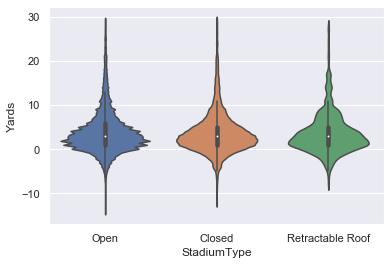

In [10]:
sns.violinplot(x="StadiumType", y='Yards', data=data[data['Yards']<30])

The violinplots for all three values seem roughly the same, so it does not seem that the StadiumType variables will be very helpful

There are some duplicates and typos in Location, let's fix the typos and split it into city and state

In [11]:
# Cleaning Location
locations = {'Orchard Park NY':'Orchard Park, NY','Orchard Park':'Orchard Park, NY','Chicago. IL':'Chicago, IL',
             'Cleveland Ohio':'Cleveland, OH', 'Jacksonville Florida':'Jacksonville, FL','Pittsburgh':'Pittsburgh, PA',
            'Detroit':'Detroit, MA','London':'London, England',
        'Mexico City':'Mexico City, Mexico','Seattle':'Seattle, WA','Cleveland':'Cleveland, OH', 'New Orleans':'New Orleans, LA'}

for old_name in locations:
    new_name = locations[old_name]
    data.replace(old_name, new_name, inplace=True)
    
location = data['Location'].str.split(',', expand=True)
data['City'] = location[0]
data['State'] = location[1].str.strip()

states = {'Calif.':'CA','FLA':'FL','Fl':'FL','Fla.':'FL','Florida':'FL', 'Ind.':'IN','La.':'LA','Ma':'MA','Maryland':'MA',
         'Md.':'MD', 'N.J.':'NJ', 'North Carolina':'NC', 'Ohio':'OH', 'Pa.':'PA','Texas':'TX'}

for old_name in states:
    new_name = states[old_name]
    data.replace(old_name, new_name, inplace=True)

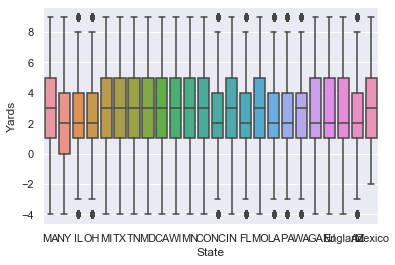

In [12]:
sns.boxplot(x='State',y='Yards',data=data[(data['Yards']<10) & (data['Yards']>-5)])

I wasn't certain about the PlayerCollegeName column so I left it intact for now. Maybe creating a variable indicating in which state the player went to college could be helpful. Position looks sort of clean. I would like to experiment by building the same models based on different positions, so for example only model based on QBs and only on TEs and so on. This would indicate which position's data is the most important.

First standardize the directions according to 16-point compass rose. Then maybe make features like if player runs against the wind. However, for that we would need orientation of the stadium.

<img src="Compass_Rose_English_North.svg.png" width=200 align=left>

In [13]:
# Cleaning WindDirection
wind_directions = {'South':'S','North':'N','West':'W', 'East':'E','Northwest':'NW','SouthWest':'SW','Northeast':'NE','From S':'S',
     'South Southeast':'SSE','From SW':'SW','s':'S', 'NorthEast':'NE','from W':'W', 'W-NW':'WNW','South Southwest':'SSW',
     'Southeast':'SE','From WSW':'WSW', 'West Northwest':'WNW','From SSE':'SSE','From W':'W', 'East North East':'ENE',
     'From ESE':'ESE','EAST':'E','East Southeast':'ESE','From SSW':'SSW','North East':'NE', 'Southwest':'SW', 
     'North/Northwest':'NNW', 'From NNE':'NNE','N-NE':'NNE','W-SW':'WSW', 'From NNW':'NNW','West-Southwest':'WSW',
     'Calm':'Missing','8':'Missing','1':'Missing','13':'Missing'}

for old_name in wind_directions:
    new_name = wind_directions[old_name]
    data.replace(old_name, new_name, inplace=True)
    
data.loc[(data['WindDirection'].isna()),'WindDirection'] = 'Missing'

It's quite cumbersome to change the type to int due to NaNs, so to avoid the trouble, I changed the type to float.

In [14]:
# Cleaning WindDirection
data.loc[data['WindSpeed']=='14-23','WindSpeed'] = 18
data.loc[data['WindSpeed']=='11-17','WindSpeed'] = 16
data.loc[data['WindSpeed']=='12-22','WindSpeed'] = 17
data.loc[data['WindSpeed']=='15 gusts up to 25','WindSpeed'] = 16
# some WindSpeed values contains characters, so below we just extract the numbers, e.g."15 MPH" will be changed to 15
data['WindSpeed'] = data['WindSpeed'].astype(str).str.extract('(\d+)')[0].astype(float)

In [15]:
# Cleaning GameWeather
rainy = ['Cloudy with periods of rain, thunder possible. Winds shifting to WNW, 10-20 mph.',
         'Cloudy, 50% change of rain','Cloudy, Rain','Light Rain','Rain','Rain Chance 40%', 
         'Rain likely, temps in low 40s.', 'Rain shower', 'Rainy', 'Scattered Showers', 'Showers',]
clear = ['Clear','Clear Skies','Clear and Cool','Clear and Sunny','Clear and cold','Clear and sunny','Clear and warm',
         'Clear skies','Partly clear',]
snowy = ['Cloudy, light snow accumulating 1-3"','Heavy lake effect snow','Snow']
sunny = ['Mostly Sunny', 'Mostly Sunny Skies','Mostly sunny','Partly Sunny','Partly sunny','Sunny',
 'Sunny Skies', 'Sunny and clear', 'Sunny and cold', 'Sunny and warm', 'Sunny, Windy', 'Sunny, highs to upper 80s',]
cloudy = ['30% Chance of Rain','Cloudy', 'Cloudy and Cool', 'Cloudy and cold','Cloudy, chance of rain',
          'Cloudy, fog started developing in 2nd quarter','Coudy','Mostly Cloudy','Mostly Coudy','Mostly cloudy',
          'Overcast','Partly Cloudy','Partly Clouidy','Partly cloudy','Party Cloudy','Sun & clouds','cloudy']
# other = ['Cold','Controlled Climate','Fair', 'Hazy','T: 51; H: 55; W: NW 10 mph']

data['GameWeatherGrouped'] = 'Other'
data.loc[data['StadiumType']=='Closed','GameWeatherGrouped'] = 'Indoor'
data.loc[data['GameWeather'].isin(rainy),'GameWeatherGrouped'] = 'Rainy'
data.loc[data['GameWeather'].isin(clear),'GameWeatherGrouped'] = 'Clear'
data.loc[data['GameWeather'].isin(snowy),'GameWeatherGrouped'] = 'Snowy'
data.loc[data['GameWeather'].isin(sunny),'GameWeatherGrouped'] = 'Sunny'
data.loc[data['GameWeather'].isin(cloudy),'GameWeatherGrouped'] = 'Cloudy'
# data.loc[data['GameWeather'].isin(other),'GameWeatherGrouped'] = 'Other'

In [16]:
# Cleaning Turf - add a isNatural column
data['isNatural'] = False
isNatural = data['Turf'].str.contains('natural', case=False) | data['Turf'].str.contains('grass', case=False)
data.loc[isNatural,'isNatural'] = True
data.loc[isNatural,'Turf'] = 'Natural grass'

turfs = {'Artifical':'Artificial','Field Turf':'FieldTurf','Field turf':'FieldTurf','FieldTurf360':'FieldTurf 360',
        'UBU Sport Speed S5-M':'UBU Speed Series-S5-M'}

for old_name in turfs:
    new_name = turfs[old_name]
    data.replace(old_name, new_name, inplace=True)

In [17]:
# Parsing PlayerBirthDate to datetime and adding Age variable
data['PlayerBirthDate'] = pd.to_datetime(data['PlayerBirthDate'],format='%m/%d/%Y')

current = datetime.datetime(2019, 11, 1)

data['PlayerAge'] = (current-data['PlayerBirthDate']).apply(lambda x: int(x.days/365))

In [18]:
# Converting player height from string in feet to centimeters
height_feet = data['PlayerHeight'].str.split('-',expand=True)
data['PlayerHeightCm'] = 30.48*height_feet[0].astype(float)+2.54*height_feet[1].astype(float)

In [19]:
# Converting GameClock which is relative to the quarter to TimeElapsed that is relative to the whole game

game_clock = data['GameClock'].str.split(':', expand=True)
data['TimeElapsed'] = data['Quarter']*15*60+game_clock[0].astype(int)*60+game_clock[1].astype(int)

In [20]:
# doubt
data['GameClock'] = pd.to_datetime(data['GameClock'].str.slice(0,5), format='%M:%S')

### Column candidates for removal
FieldPosition indicates on which team's half the play is happening. Probably it can be deleted, but let's leave it for now. After executing the code below, the attacking team will always attack from left to right. Therefore, we can probably delete the PlayDirection column. DisplayName which is player name is also redundant for training because we already have NflId.

In [21]:
data.to_csv("train_cleaned.csv")

## Data exploration

In [3]:
data = pd.read_csv("train_cleaned.csv")

In [8]:
data.shape

(509762, 66)

In [9]:
score_col = ['HomeScoreBeforePlay','VisitorScoreBeforePlay']

In [10]:
data['OffenseFormation'].unique()

array(['SHOTGUN', 'SINGLEBACK', 'JUMBO', 'PISTOL', 'I_FORM', 'ACE',
       'WILDCAT', nan, 'EMPTY'], dtype=object)

Maybe splitting the OffensePersonnel variable into objects could improve the score. OL stands for Offensive Lineman

In [14]:
offense_formations = data['OffensePersonnel'].unique()
print('Possible offensive positions',list(set(re.findall('[A-Z]+',offense_formations.sum()))))

Possible offensive positions ['WR', 'LB', 'RB', 'DL', 'DB', 'QB', 'TE', 'OL']


In [15]:
positions = ['OL', 'QB', 'RB', 'TE', 'WR', 'DL', 'DB','LB']
nr_positions = ['Offense #'+pos for pos in positions]

for pos in nr_positions: data[pos] = 0

for formation in offense_formations:
    pos_list = [p.strip() for p in formation.split(',')]
#     print(pos_list)
    df_values = np.zeros(len(positions),int)
    for pos in pos_list:
        for i, p in enumerate(positions):
            if p in pos:
                df_values[i] = pos[0]
    if 'QB' not in formation:
        df_values[1] = 1
    if 'OL' not in formation:
        df_values[0] = 11-sum(df_values)
    data.loc[data['OffensePersonnel']==formation, nr_positions] = df_values
#     print('Formation',formation)

['1 RB', '1 TE', '3 WR']
Formation 1 RB, 1 TE, 3 WR
['6 OL', '2 RB', '2 TE', '0 WR']
Formation 6 OL, 2 RB, 2 TE, 0 WR
['1 RB', '3 TE', '1 WR']
Formation 1 RB, 3 TE, 1 WR
['1 RB', '2 TE', '2 WR']
Formation 1 RB, 2 TE, 2 WR
['6 OL', '1 RB', '2 TE', '1 WR']
Formation 6 OL, 1 RB, 2 TE, 1 WR
['2 RB', '1 TE', '2 WR']
Formation 2 RB, 1 TE, 2 WR
['2 RB', '2 TE', '1 WR']
Formation 2 RB, 2 TE, 1 WR
['0 RB', '3 TE', '2 WR']
Formation 0 RB, 3 TE, 2 WR
['0 RB', '1 TE', '4 WR']
Formation 0 RB, 1 TE, 4 WR
['6 OL', '1 RB', '0 TE', '3 WR']
Formation 6 OL, 1 RB, 0 TE, 3 WR
['6 OL', '1 RB', '1 TE', '2 WR']
Formation 6 OL, 1 RB, 1 TE, 2 WR
['1 RB', '2 TE', '1 WR', '1 DL']
Formation 1 RB, 2 TE, 1 WR,1 DL
['1 RB', '3 TE', '0 WR', '1 DL']
Formation 1 RB, 3 TE, 0 WR,1 DL
['1 RB', '0 TE', '4 WR']
Formation 1 RB, 0 TE, 4 WR
['1 RB', '1 TE', '2 WR', '1 DL']
Formation 1 RB, 1 TE, 2 WR,1 DL
['6 OL', '2 RB', '0 TE', '2 WR']
Formation 6 OL, 2 RB, 0 TE, 2 WR
['2 RB', '0 TE', '3 WR']
Formation 2 RB, 0 TE, 3 WR
['6 OL'

In [16]:
# data[['OffensePersonnel']+nr_positions].drop_duplicates(subset='OffensePersonnel')

In [12]:
data['FieldPosition'].unique()

array(['NE', 'KC', nan, 'BUF', 'NYJ', 'ATL', 'CHI', 'CIN', 'BLT', 'CLV',
       'PIT', 'ARZ', 'DET', 'JAX', 'HST', 'TEN', 'OAK', 'WAS', 'PHI',
       'LA', 'IND', 'GB', 'SEA', 'CAR', 'SF', 'DAL', 'NYG', 'NO', 'MIN',
       'DEN', 'LAC', 'TB', 'MIA'], dtype=object)

Same remarks as for offense

In [17]:
defense_formations = data['DefensePersonnel'].unique()
print('Possible defensive positions',list(set(re.findall('[A-Z]+',defense_formations.sum()))))

Possible defensive positions ['OL', 'LB', 'DL', 'DB']


In [18]:
positions = ['DL', 'OL', 'DB', 'LB']
nr_positions = ['Defense #'+pos for pos in positions]

for pos in nr_positions: data[pos] = 0

for formation in defense_formations:
    pos_list = [p.strip() for p in formation.split(',')]
    df_values = np.zeros(len(positions),int)
    for pos in pos_list:
        for i, p in enumerate(positions):
            if p in pos:
                df_values[i] = pos[0]
    data.loc[data['DefensePersonnel']==formation, nr_positions] = df_values
#     print('Formation',formation)

In [19]:
data[['DefensePersonnel']+nr_positions].drop_duplicates(subset='DefensePersonnel').head()

,DefensePersonnel,Defense #DL,Defense #OL,Defense #DB,Defense #LB
0,"2 DL, 3 LB, 6 DB",2,0,6,3
66,"4 DL, 4 LB, 3 DB",4,0,3,4
88,"3 DL, 2 LB, 6 DB",3,0,6,2
132,"3 DL, 4 LB, 4 DB",3,0,4,4
286,"3 DL, 3 LB, 5 DB",3,0,5,3


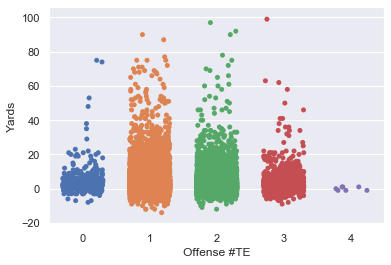

In [131]:
import matplotlib.pyplot as plt
# plt.figure(figsize = (20,20))
s = data=data.drop_duplicates(subset='PlayId')
sns.stripplot(x='Offense #TE', y='Yards',data=s,jitter=.3)

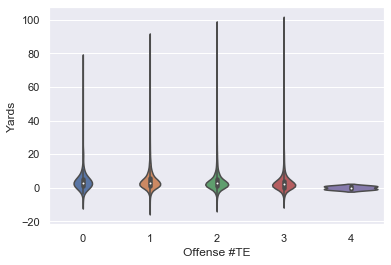

In [132]:
sns.violinplot(x='Offense #TE', y='Yards',data=s,jitter=.3)

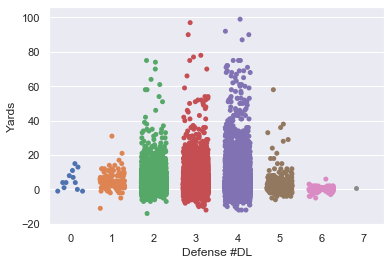

In [128]:
import matplotlib.pyplot as plt
# plt.figure(figsize = (20,20))
s = data=data.drop_duplicates(subset='PlayId')
sns.stripplot(x='Defense #DL', y='Yards',data=s,jitter=.3)


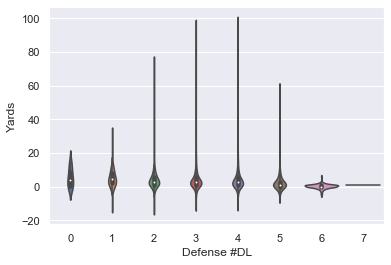

In [129]:
sns.violinplot(x='Defense #DL', y='Yards',data=s)

In [20]:
data.shape

(509762, 78)

In [21]:
data.to_csv('train_cleaned_formations.csv', index=False)

In [15]:
data[data['Yards']<0].shape[0]/data.shape[0]

0.11052608864528937

In 11% of plays the offensive team looses yards instead of gaining

In [16]:
data['Yards'].describe()

count    509762.000000
mean          4.212334
std           6.436167
min         -14.000000
25%           1.000000
50%           3.000000
75%           6.000000
max          99.000000
Name: Yards, dtype: float64

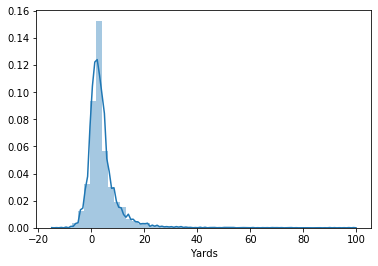

In [22]:
sns.distplot(data['Yards'])

In [22]:
# team name of the player
data['TeamName'] = np.where(data['Team']=='away', data['VisitorTeamAbbr'], data['HomeTeamAbbr'])

In [23]:
def closestOpponent(x):
    coords = ['X_std','Y_std']
#     get rusher index
    rusher_ix = x[x['NflId']==x['NflIdRusher']].index[0]
#     get rusher X and Y
    rusher_coords = data.at[rusher_ix,'X_std'],data.at[rusher_ix,'Y_std']
#     get coords of defensive team
    defensive_team_coords = x[x['PossessionTeam']!=x['TeamName']][coords]
#     get euclidean distance between each deffense team player and the rusher
    euclideanDis = (defensive_team_coords-rusher_coords).pow(2).sum(1).pow(0.5)
#     get minimal distance to the rusher
    return euclideanDis.min()

d = data.groupby(by='PlayId').apply(closestOpponent)

data['ClosestOpponent'] = [d[x] for x in data['PlayId']]

https://www.data-to-viz.com/caveat/overplotting.html

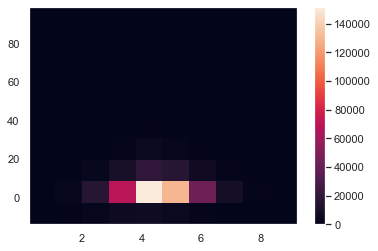

In [152]:
x = data['ClosestOpponent']
y = data['Yards']
h =plt.hist2d(x, y)
plt.colorbar(h[3])

In [150]:
for x in data['PlayId']:
    print(x)
    break

20170907000118


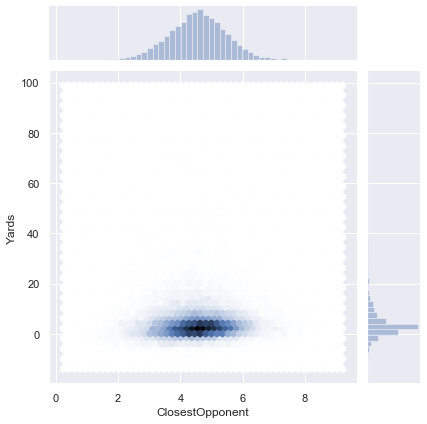

In [155]:
a = sns.jointplot(x='ClosestOpponent', y='Yards',data=data, kind='hex')

In [24]:
rushers = data[data.NflId==data.NflIdRusher].copy()
rushers['DistRushScrimmage'] = (rushers['YardLine_std']+10-rushers['X_std']).abs()

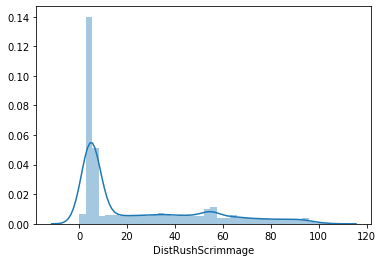

In [28]:
sns.distplot(rushers['DistRushScrimmage'])

In [39]:
rushers['DistRushScrimmage'].describe()

count    23171.000000
mean         4.925150
std          0.937332
min          0.020000
25%          4.350000
50%          4.880000
75%          5.450000
max         12.770000
Name: DistRushScrimmage, dtype: float64

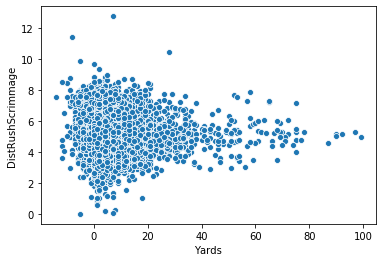

In [33]:
sns.scatterplot(x='Yards', y='DistRushScrimmage', data=rushers)

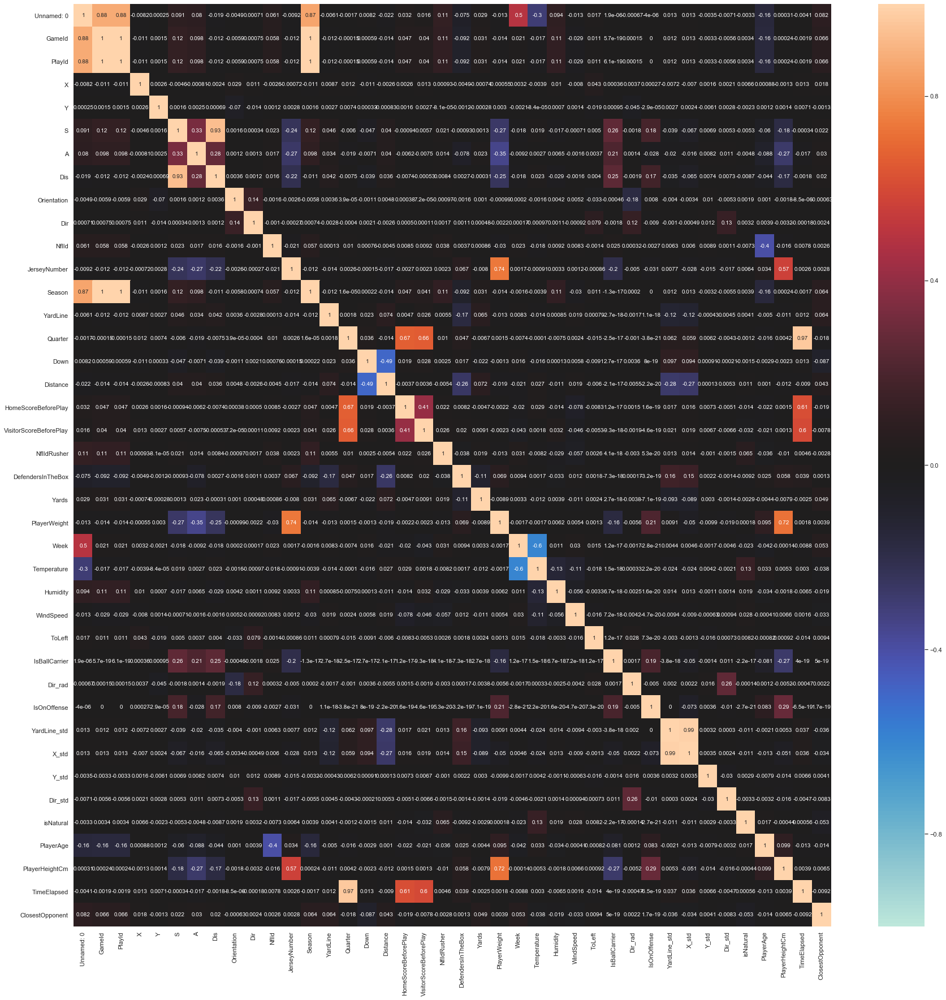

In [158]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize = (30,30))

sns.heatmap(data.corr(),vmin=-1,vmax=1,center=0,annot=True)
# plt.show()

I was expecting a linear relationship but boy was I wrong

In [32]:
data['YardLine_std'].describe()

count    509762.000000
mean         47.961849
std          25.160334
min           1.000000
25%          26.000000
50%          44.000000
75%          68.000000
max          99.000000
Name: YardLine_std, dtype: float64

## TO DO
* Check if it's more difficult to gain yardage close to the defensive team endzone
* Prediction processing trick: Remember that the yards gained cant be more than length of the field - line of scrimmage!
* Prediction processing trick: For rows with the same PlayId, the Yards must be the same
* Get a better intuition what the Dis variables really is, try plotting the points
* Try to visualize from the data what happened in the game, retrieve touchdowns, fumbles, interceptions etc. Verify it with a match, you can watch all matches on youtube https://www.youtube.com/channel/UCP4Wts8iiR9-Ddfq7FK0x3g/videos


In [82]:
data.to_csv('train_proc.csv',index=False)

KeyboardInterrupt: 

In [62]:
data = pd.read_csv('train_proc.csv')

In [64]:
from sklearn.model_selection import GroupKFold

In [65]:
data = data.drop(['Unnamed: 0'],axis=1)

In [66]:
cat_vars = data.select_dtypes(include='object').columns; cat_vars

Index(['Team', 'DisplayName', 'GameClock', 'PossessionTeam', 'FieldPosition',
       'OffenseFormation', 'OffensePersonnel', 'DefensePersonnel',
       'PlayDirection', 'TimeHandoff', 'TimeSnap', 'PlayerHeight',
       'PlayerBirthDate', 'PlayerCollegeName', 'Position', 'HomeTeamAbbr',
       'VisitorTeamAbbr', 'Stadium', 'Location', 'StadiumType', 'Turf',
       'GameWeather', 'WindDirection', 'TeamOnOffense', 'City', 'State',
       'GameWeatherGrouped', 'TeamName'],
      dtype='object')

In [67]:
cont_vars = data.select_dtypes(exclude='object').columns; cont_vars

Index(['GameId', 'PlayId', 'X', 'Y', 'S', 'A', 'Dis', 'Orientation', 'Dir',
       'NflId', 'JerseyNumber', 'Season', 'YardLine', 'Quarter', 'Down',
       'Distance', 'HomeScoreBeforePlay', 'VisitorScoreBeforePlay',
       'NflIdRusher', 'DefendersInTheBox', 'Yards', 'PlayerWeight', 'Week',
       'Temperature', 'Humidity', 'WindSpeed', 'ToLeft', 'IsBallCarrier',
       'Dir_rad', 'IsOnOffense', 'YardLine_std', 'X_std', 'Y_std', 'Dir_std',
       'isNatural', 'PlayerAge', 'PlayerHeightCm', 'TimeElapsed',
       'Offense #OL', 'Offense #QB', 'Offense #RB', 'Offense #TE',
       'Offense #WR', 'Offense #DL', 'Offense #DB', 'Offense #LB',
       'Defense #DL', 'Defense #OL', 'Defense #DB', 'Defense #LB',
       'ClosestOpponent'],
      dtype='object')

In [68]:
for col in cont_vars:
    data[col] = data[col].fillna(data[col].median())

In [36]:
folds.n_splits

2

In [70]:
for col in cat_vars:
    data[col] = data[col].fillna('Missing')

In [72]:
from sklearn.preprocessing import LabelEncoder

In [59]:
data.head()

,GameId,PlayId,Team,X,Y,S,A,Dis,Orientation,Dir,NflId,DisplayName,JerseyNumber,Season,YardLine,Quarter,GameClock,PossessionTeam,Down,Distance,FieldPosition,HomeScoreBeforePlay,VisitorScoreBeforePlay,NflIdRusher,OffenseFormation,OffensePersonnel,DefendersInTheBox,DefensePersonnel,PlayDirection,TimeHandoff,TimeSnap,Yards,PlayerHeight,PlayerWeight,PlayerBirthDate,PlayerCollegeName,Position,HomeTeamAbbr,VisitorTeamAbbr,Week,Stadium,Location,StadiumType,Turf,GameWeather,Temperature,Humidity,WindSpeed,WindDirection,ToLeft,IsBallCarrier,Dir_rad,TeamOnOffense,IsOnOffense,YardLine_std,X_std,Y_std,Dir_std,City,State,GameWeatherGrouped,isNatural,PlayerAge,PlayerHeightCm,TimeElapsed,Offense #OL,Offense #QB,Offense #RB,Offense #TE,Offense #WR,Offense #DL,Offense #DB,Offense #LB,Defense #DL,Defense #OL,Defense #DB,Defense #LB,TeamName,ClosestOpponent
0,2017090700,20170907000118,away,73.91,34.84,1.69,1.13,0.40,81.99,177.18,496723,Eric Berry,29,2017,35,1,1900-01-01 00:14:14,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-0,212,1988-12-29,Tennessee,SS,NE,KC,1,Gillette Stadium,"Foxborough, MA",Open,FieldTurf,Clear and warm,63.0,77.0,8.0,SW,True,False,4.761607,home,False,35,46.09,18.493333,1.620015,Foxborough,MA,Clear,False,30,182.88,1754,5,1,1,1,3,0,0,0,2,0,6,3,KC,4.59331
1,2017090700,20170907000118,away,74.67,32.64,0.42,1.35,0.01,27.61,198.70,2495116,Allen Bailey,97,2017,35,1,1900-01-01 00:14:14,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,288,1989-03-25,Miami,DE,NE,KC,1,Gillette Stadium,"Foxborough, MA",Open,FieldTurf,Clear and warm,63.0,77.0,8.0,SW,True,False,4.386012,home,False,35,45.33,20.693333,1.244420,Foxborough,MA,Clear,False,30,190.50,1754,5,1,1,1,3,0,0,0,2,0,6,3,KC,4.59331
2,2017090700,20170907000118,away,74.00,33.20,1.22,0.59,0.31,3.01,202.73,2495493,Justin Houston,50,2017,35,1,1900-01-01 00:14:14,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,270,1989-01-21,Georgia,DE,NE,KC,1,Gillette Stadium,"Foxborough, MA",Open,FieldTurf,Clear and warm,63.0,77.0,8.0,SW,True,False,4.315676,home,False,35,46.00,20.133333,1.174083,Foxborough,MA,Clear,False,30,190.50,1754,5,1,1,1,3,0,0,0,2,0,6,3,KC,4.59331
3,2017090700,20170907000118,away,71.46,27.70,0.42,0.54,0.02,359.77,105.64,2506353,Derrick Johnson,56,2017,35,1,1900-01-01 00:14:14,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-3,245,1982-11-22,TX,ILB,NE,KC,1,Gillette Stadium,"Foxborough, MA",Open,FieldTurf,Clear and warm,63.0,77.0,8.0,SW,True,False,6.010216,home,False,35,48.54,25.633333,2.868623,Foxborough,MA,Clear,False,36,190.50,1754,5,1,1,1,3,0,0,0,2,0,6,3,KC,4.59331
4,2017090700,20170907000118,away,69.32,35.42,1.82,2.43,0.16,12.63,164.31,2530794,Ron Parker,38,2017,35,1,1900-01-01 00:14:14,NE,3,2,NE,0,0,2543773,SHOTGUN,"1 RB, 1 TE, 3 WR",6.0,"2 DL, 3 LB, 6 DB",left,2017-09-08T00:44:06.000Z,2017-09-08T00:44:05.000Z,8,6-0,206,1987-08-17,Newberry,FS,NE,KC,1,Gillette Stadium,"Foxborough, MA",Open,FieldTurf,Clear and warm,63.0,77.0,8.0,SW,True,False,4.986231,home,False,35,50.68,17.913333,1.844638,Foxborough,MA,Clear,False,32,182.88,1754,5,1,1,1,3,0,0,0,2,0,6,3,KC,4.59331


In [ ]:
# data = data.drop(['X','Y','Yardline'],axis=1)

In [74]:
for col in cat_vars:
    le = LabelEncoder()
    le.fit(data[col])
    data[col] = le.transform(data[col])
#     test[col] = le.transform(list(test[col].astype(str).values))   

In [53]:
cont_vars

Index(['GameId', 'PlayId', 'X', 'Y', 'S', 'A', 'Dis', 'Orientation', 'Dir',
       'NflId', 'JerseyNumber', 'Season', 'YardLine', 'Quarter', 'Down',
       'Distance', 'HomeScoreBeforePlay', 'VisitorScoreBeforePlay',
       'NflIdRusher', 'DefendersInTheBox', 'Yards', 'PlayerWeight', 'Week',
       'Temperature', 'Humidity', 'WindSpeed', 'ToLeft', 'IsBallCarrier',
       'Dir_rad', 'IsOnOffense', 'YardLine_std', 'X_std', 'Y_std', 'Dir_std',
       'isNatural', 'PlayerAge', 'PlayerHeightCm', 'TimeElapsed',
       'Offense #OL', 'Offense #QB', 'Offense #RB', 'Offense #TE',
       'Offense #WR', 'Offense #DL', 'Offense #DB', 'Offense #LB',
       'Defense #DL', 'Defense #OL', 'Defense #DB', 'Defense #LB',
       'ClosestOpponent'],
      dtype='object')

In [75]:
rushers = data[data.NflId==data.NflIdRusher]

In [127]:
X['GameId'].unique()[:10]

array([2017090700, 2017091000, 2017091001, 2017091002, 2017091003,
       2017091004, 2017091005, 2017091007, 2017091008, 2017091009],
      dtype=int64)

In [160]:
best_features.sort_values(by="importance", ascending=False)

In [190]:
from sklearn.metrics import mean_squared_error

def train_model(X, y, folds, model_type='lgb', eval_metric='auc', n_jobs=-1, n_estimators=None, plot_feature_importance=True, verbose=500,early_stopping_rounds=200):
    result_dict = {}
    scores = []
#     not sure if i should add this "folds.n_splits if splits is None else " below or not
    n_splits = folds.n_splits
    columns = X.columns
    # out-of-fold predictions on train data
    oof = np.zeros((len(X), 1))
    feature_importance = pd.DataFrame()
    for fold_n, (train_index, valid_index) in enumerate(folds.split(X,y,X['GameId'])):
        X_train, X_valid = X[columns].iloc[train_index], X[columns].iloc[valid_index]
        y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
        
        model = lgb.LGBMRegressor(n_estimators=n_estimators, n_jobs = n_jobs)
        model.fit(X_train, y_train, 
                eval_set=[(X_train, y_train), (X_valid, y_valid)], eval_metric='rmse',
                verbose=verbose, early_stopping_rounds=early_stopping_rounds)
        y_pred = model.predict(X_valid)
        rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
        oof[valid_index] = y_pred.reshape(-1, 1)
        scores.append(rmse)
    
        if model_type == 'lgb' and plot_feature_importance:
            # feature importance
            fold_importance = pd.DataFrame()
            fold_importance["feature"] = columns
            fold_importance["importance"] = model.feature_importances_
            fold_importance["fold"] = fold_n + 1
            feature_importance = pd.concat([feature_importance, fold_importance], axis=0)
    
    print('CV mean score: {0:.4f}, std: {1:.4f}.'.format(np.mean(scores), np.std(scores)))
    
    result_dict['oof'] = oof
    result_dict['scores'] = scores
    
    if model_type == 'lgb':
        if plot_feature_importance:
            feature_importance["importance"] /= n_splits
            best_features = feature_importance[["feature", "importance"]].groupby("feature").mean().sort_values(
                by="importance", ascending=False)[:50].reset_index(level=['feature'])


            plt.figure(figsize=(16, 12));
            sns.barplot(x="importance", y="feature", data=best_features);
            plt.title('LGB Features (avg over folds)');
            
            result_dict['feature_importance'] = feature_importance
            result_dict['top_columns'] = best_features['feature'].unique()
        
    return result_dict

Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[50]	training's rmse: 5.55545	training's l2: 30.863	valid_1's rmse: 5.92762	valid_1's l2: 35.1367
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[22]	training's rmse: 5.8651	training's l2: 34.3994	valid_1's rmse: 6.22134	valid_1's l2: 38.7051
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[51]	training's rmse: 5.59092	training's l2: 31.2584	valid_1's rmse: 5.62022	valid_1's l2: 31.5869
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[22]	training's rmse: 5.83507	training's l2: 34.048	valid_1's rmse: 6.39171	valid_1's l2: 40.854
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[73]	training's rmse: 5.34573	training's l2: 28.5769	valid_1's rmse: 5.91738	valid_1's l2: 35.0154
Training until validatio

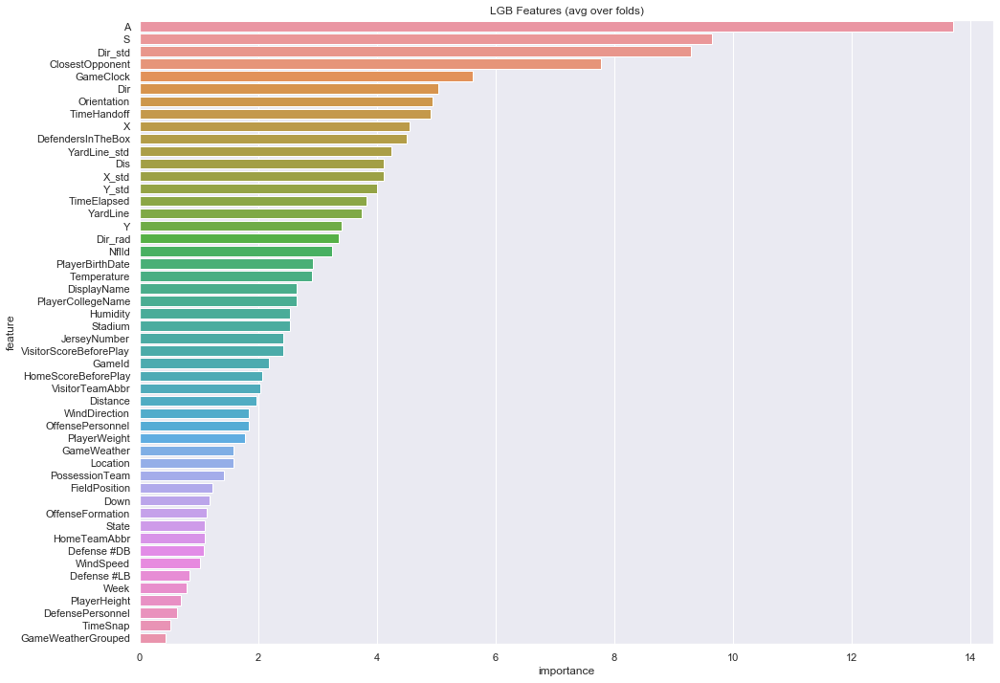

In [191]:
import matplotlib.pyplot as plt
X = rushers.drop(['Yards'],axis=1)
y = rushers['Yards']
folds = GroupKFold(n_splits=10)
results = train_model(X, y, folds, n_estimators=3000) # a, s, clos, dirstd,gamecloc, dir,orient, x, time

## Predictions

The 1st place in another competition that used CRPS (https://www.kaggle.com/c/how-much-did-it-rain/discussion/14860#latest-82643) used a combination of a step function and empirical distribution computed from the training set.

In [136]:
data['DefendersInTheBox'].unique()

array([ 6.,  7.,  9.,  5.,  8., 11., 10.,  4.,  3., nan,  2.,  1.])

## Draft

In [30]:
data['YardsEnd'] = data['YardLine_std']+data['Yards']

After standardization we can see that endzone is not counted in Yards gained because YardsEnd ranges from 0 to 100. Okey wait, that's kind of obvious.

In [109]:
set(le.inverse_transform(data['Position']))

{'ARZ',
 'ATL',
 'BLT',
 'BUF',
 'CAR',
 'CHI',
 'CIN',
 'CLV',
 'DAL',
 'DEN',
 'DET',
 'GB',
 'HST',
 'IND',
 'JAX',
 'KC',
 'LA',
 'LAC',
 'MIA',
 'MIN',
 'NE',
 'NO',
 'NYG',
 'NYJ',
 'OAK'}

In [31]:
data['YardsEnd'].describe()

count    509762.000000
mean         52.174183
std          25.386721
min           0.000000
25%          31.000000
50%          48.000000
75%          72.000000
max         100.000000
Name: YardsEnd, dtype: float64

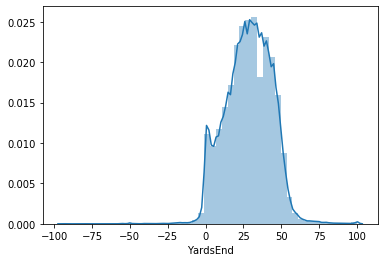

In [23]:
sns.distplot(data['YardsEnd'])

In [46]:
data['TimeSnap'] = pd.to_datetime(data['TimeSnap'],format='%Y-%m-%dT%I:%M:%S.%fZ')
data['TimeHandoff'] = pd.to_datetime(data['TimeHandoff'],format='%Y-%m-%dT%I:%M:%S.%fZ')
# data['TimeDiff'] = (data['TimeHandoff']-data['TimeSnap']).dt.total_seconds()

TimeDiff doesn't seem relevant

In [55]:
data

0         2017090700
1         2017090700
2         2017090700
3         2017090700
4         2017090700
5         2017090700
6         2017090700
7         2017090700
8         2017090700
9         2017090700
10        2017090700
11        2017090700
12        2017090700
13        2017090700
14        2017090700
15        2017090700
16        2017090700
17        2017090700
18        2017090700
19        2017090700
20        2017090700
21        2017090700
22        2017090700
23        2017090700
24        2017090700
25        2017090700
26        2017090700
27        2017090700
28        2017090700
29        2017090700
30        2017090700
31        2017090700
32        2017090700
33        2017090700
34        2017090700
35        2017090700
36        2017090700
37        2017090700
38        2017090700
39        2017090700
40        2017090700
41        2017090700
42        2017090700
43        2017090700
44        2017090700
45        2017090700
46        2017090700
47        201

The second method is 3 times faster than the first and they do the same thing

In [6]:

data = pd.read_csv('train.csv')
data.loc[data.VisitorTeamAbbr == "ARI", 'VisitorTeamAbbr'] = "ARZ"
data.loc[data.HomeTeamAbbr == "ARI", 'HomeTeamAbbr'] = "ARZ"

data.loc[data.VisitorTeamAbbr == "BAL", 'VisitorTeamAbbr'] = "BLT"
data.loc[data.HomeTeamAbbr == "BAL", 'HomeTeamAbbr'] = "BLT"

data.loc[data.VisitorTeamAbbr == "CLE", 'VisitorTeamAbbr'] = "CLV"
data.loc[data.HomeTeamAbbr == "CLE", 'HomeTeamAbbr'] = "CLV"

data.loc[data.VisitorTeamAbbr == "HOU", 'VisitorTeamAbbr'] = "HST"
data.loc[data.HomeTeamAbbr == "HOU", 'HomeTeamAbbr'] = "HST"

In [10]:
data = pd.read_csv('train.csv')
teams = {'ARI':'ARZ','BAL':'BLT','CLE':'CLV', 'HOU':'HST'}
for old_name in teams:
    new_name = teams[old_name]
    data.replace(old_name, new_name, inplace=True)

In [114]:
def stadium(x):
    stadiumName = x['DisplayName'].values[0]
    if len(x['Position'].unique())>2:
        print('bu,')
    stadiumTypes = str(x['Position'].unique())
    stadiums_dict['DisplayName'].append(stadiumName)
    stadiums_dict['Position'].append(stadiumTypes)
stadiums_dict = {'DisplayName':[], 'Position':[]}
data.groupby(by='DisplayName').apply(stadium)

stadiums_df = pd.DataFrame.from_dict(stadiums_dict)
stadiums_df
# stadium type: open, closed, retractable
# isRetractableRoofOpen: true, false
# tiaa - bowl -> open
# tiaa - cloudy -> open
# heinz -> open
# dome -> retractable



bu,


,DisplayName,Position
0,A'Shawn Robinson,['DT']
1,A'Shawn Robinson,['DT']
2,A.J. Bouye,['CB']
3,A.J. Cann,['G']
4,A.J. Derby,['TE']
5,A.J. Francis,['DT']
6,A.J. Green,['WR']
7,A.J. Klein,['OLB']
8,A.Q. Shipley,['C']
9,AJ McCarron,['QB']


In [277]:
# converting windspeed to int
# nan_ixs = data[data['WindSpeed'].isna()].index
# notnan_ixs = data[~data['WindSpeed'].isna()].index

# data['WindSpeed'] = data['WindSpeed'].fillna('-1').astype(int)

# data.loc[nan_ixs,'WindSpeed'] = int(data.loc[notnan_ixs,'WindSpeed'].mean())

In [ ]:
def areValuesEqual(x):
# x is a dataframe where each row has the same PlayId
# the line below checks if values in the column 'Yards' are equal
    return x['Yards'].nunique() == 1

# for each PlayId check if values for the same PlayId are all equal
d = data.groupby(by='PlayId').apply(areValuesEqual).any(); d

### Geometrical variables
Seems like the X and Y coordinates are measured at the time of handoff, based on that game from Week 1 Season 2018/19 between ATL and PHI. According to this thread: https://www.kaggle.com/c/nfl-big-data-bowl-2020/discussion/111935#latest-645825 all "geometrical" features like X, Y, orientation, degrees were measured at the time of handoff.
Here is a screenshot from the game<br>
<img src="x_y_coordinates.png" width='400' align='left'>

And here is are the X and Y values for players of PHI Eagles (which were playing at home, in green jerseys)

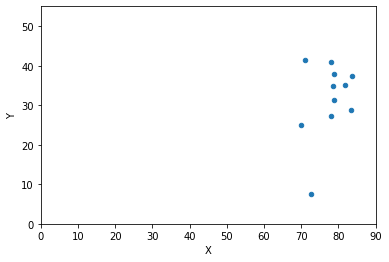

In [116]:
data.iloc[261811:261822,:].plot.scatter(x='X',y='Y',ylim=(0,55),xlim=(0,90))